## **Automated Traffic Violation Monitoring with AI & Computer Vision**

# **Project Overview**
This project aims to develop an Automated Traffic Violation Detection System by integrating Machine Learning with Explainable AI (XAI) techniques.Vehicle motion data—such as speed, distance, lane deviation, and time—is analyzed to identify overspeeding violations and provide transparent insights into model decisions.

The workflow includes:

**Data Preprocessing** – Cleaning, structuring, and transforming traffic data.

Feature Engineering & Regression Analysis – Applying Linear Regression to estimate vehicle speed based on time and distance features.

**Model Training (Classification)** - Using a Random Forest Classifier to detect whether a vehicle’s speed exceeds

**Import Libraries & Config:**

In [33]:
# 🧠 Cell 1 – Install and Import Libraries
!pip install scikit-learn xgboost lightgbm catboost shap matplotlib seaborn --quiet

import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    roc_auc_score, confusion_matrix
)

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import BernoulliNB, GaussianNB

try:
    from catboost import CatBoostClassifier
    CATBOOST_INSTALLED = True
except:
    CATBOOST_INSTALLED = False


**1️⃣Load the dataset:-**

In [34]:
import pandas as pd

#  Cell 2 – Load Dataset
path = "/content/traffic_data voilation(1).csv"    # also remove letter 'p' at end
df = pd.read_csv(path)
print("✅ Dataset loaded successfully!")
print("Shape:", df.shape)


✅ Dataset loaded successfully!
Shape: (500, 11)


2️⃣**Target Column & Preprocessing Setup (Binary Version)**:-

In [35]:
# 🎯 Cell 3 – Target Column & Preprocessing Setup (Binary Version)

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder

FORCE_TARGET = None  # You can set manually if needed (e.g., "Violation")

# Auto-detect target column
if FORCE_TARGET:
    target_col = FORCE_TARGET
else:
    possible_targets = ['violation', 'Violation', 'label', 'target', 'class', 'result', 'offence', 'offense', 'Violation_Type']
    target_col = next((c for c in possible_targets if c in df.columns), df.columns[-1])

print("Target column detected as:", target_col)

# ✅ Convert to binary: Violation (1) vs No Violation (0)
# You can adjust the string matching below depending on your dataset
df['Target_Binary'] = df[target_col].apply(lambda x: 0 if str(x).lower() in ['no violation', 'none', 'clean', 'no'] else 1)

y = df['Target_Binary']
X = df.drop(columns=[target_col, 'Target_Binary'])

# Drop ID-like columns (unique identifiers)
id_like = [c for c in X.columns if X[c].nunique() == X.shape[0]]
if id_like:
    X = X.drop(columns=id_like)
    print("Dropped ID-like columns:", id_like)

# Identify numeric & categorical columns
num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X.select_dtypes(include=['object','category','bool']).columns.tolist()

# Small-unique numeric columns as categorical
for c in num_cols.copy():
    if X[c].nunique() <= 10:
        num_cols.remove(c)
        cat_cols.append(c)

print("Numeric columns:", num_cols)
print("Categorical columns:", cat_cols)
print("Binary target distribution:\n", y.value_counts())

# ⚙️ Cell 4 – Data Preprocessing & Train/Test Split
numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', numeric_pipeline, num_cols),
    ('cat', categorical_pipeline, cat_cols)
])

# Split data (no need for LabelEncoder now)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

print("Train shape:", X_train.shape, "Test shape:", X_test.shape)
print("✅ Target is now binary (0 = No Violation, 1 = Violation)")

Target column detected as: violation
Dropped ID-like columns: ['distance_to_stopline', 'light_state_duration', 'image_path']
Numeric columns: ['speed']
Categorical columns: ['traffic_light_state', 'vehicle_type', 'time_of_day', 'weather', 'camera_angle', 'lane_id']
Binary target distribution:
 Target_Binary
1    500
Name: count, dtype: int64
Train shape: (400, 7) Test shape: (100, 7)
✅ Target is now binary (0 = No Violation, 1 = Violation)


In [36]:
def plot_confusion_matrix(model, X_test, y_test, model_name):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)

    print(f"=== {model_name} ===")
    print("Accuracy:", acc)
    print(classification_report(y_test, y_pred))

    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm')
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    return acc


**3. Target and Preprocessing**:-

In [37]:
# 🎯 Correct Target and Preprocessing
target_col = 'violation'

y = df[target_col]
X = df.drop(columns=[target_col])

# Drop ID-like columns
id_like = [c for c in X.columns if X[c].nunique() == X.shape[0]]
if id_like:
    X = X.drop(columns=id_like)
    print("Dropped ID-like columns:", id_like)

# Identify numeric & categorical columns
num_cols = X.select_dtypes(include=['int64','float64']).columns.tolist()
cat_cols = X.select_dtypes(include=['object','category','bool']).columns.tolist()

# Treat small-unique numeric as categorical
for c in num_cols.copy():
    if X[c].nunique() <= 10:
        num_cols.remove(c)
        cat_cols.append(c)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

numeric_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', numeric_pipeline, num_cols),
    ('cat', categorical_pipeline, cat_cols)
])

# Encode target
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y_enc = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(
    X, y_enc, test_size=0.2, stratify=y_enc, random_state=42
)

print("Train shape:", X_train.shape, "Test shape:", X_test.shape)
print("Classes:", le.classes_)

Dropped ID-like columns: ['distance_to_stopline', 'light_state_duration', 'image_path']
Train shape: (400, 8) Test shape: (100, 8)
Classes: [0 1]


**4. Decision Tree**:-

=== Decision Tree ===
Accuracy: 0.9

               precision    recall  f1-score   support

           0       0.94      0.96      0.95        92
           1       0.33      0.25      0.29         8

    accuracy                           0.90       100
   macro avg       0.63      0.60      0.62       100
weighted avg       0.89      0.90      0.89       100



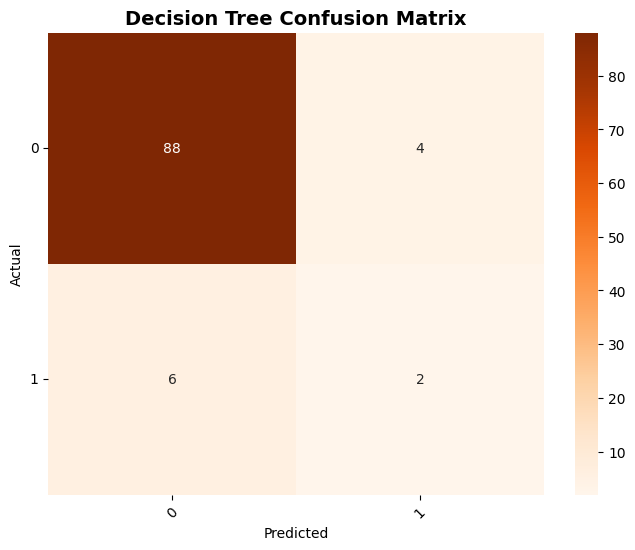

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

dt = DecisionTreeClassifier(random_state=42)
dt.fit(preprocessor.fit_transform(X_train), y_train)

y_pred_dt = dt.predict(preprocessor.transform(X_test))

acc_dt = accuracy_score(y_test, y_pred_dt)
print("=== Decision Tree ===")
print("Accuracy:", round(acc_dt, 3))
print("\n", classification_report(y_test, y_pred_dt, target_names=[str(cls) for cls in le.classes_]))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("Decision Tree Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**5. K-Nearest Neighbors (KNN):-**

=== K-Nearest Neighbors (KNN) ===
Accuracy: 0.93

               precision    recall  f1-score   support

           0       0.93      1.00      0.96        92
           1       1.00      0.12      0.22         8

    accuracy                           0.93       100
   macro avg       0.96      0.56      0.59       100
weighted avg       0.93      0.93      0.90       100



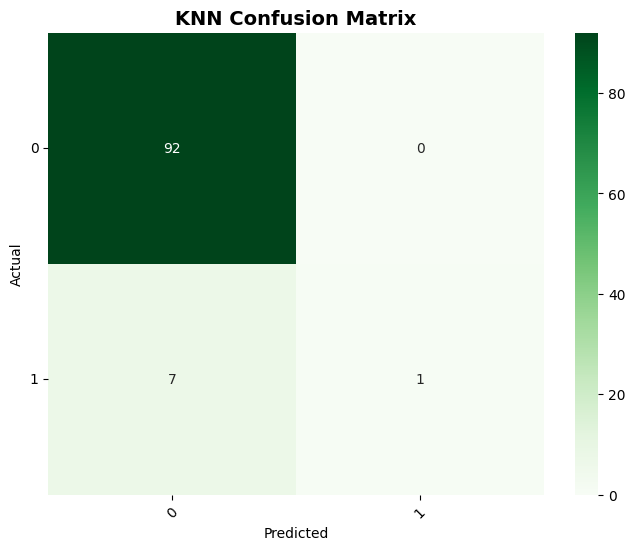

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_knn = knn.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_knn = accuracy_score(y_test, y_pred_knn)
print("=== K-Nearest Neighbors (KNN) ===")
print("Accuracy:", round(acc_knn, 3))
print("\n", classification_report(y_test, y_pred_knn, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_knn)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("KNN Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**6. Support Vector Machine (SVM):-**

=== Support Vector Machine (SVM) ===
Accuracy: 0.92

               precision    recall  f1-score   support

           0       0.92      1.00      0.96        92
           1       0.00      0.00      0.00         8

    accuracy                           0.92       100
   macro avg       0.46      0.50      0.48       100
weighted avg       0.85      0.92      0.88       100



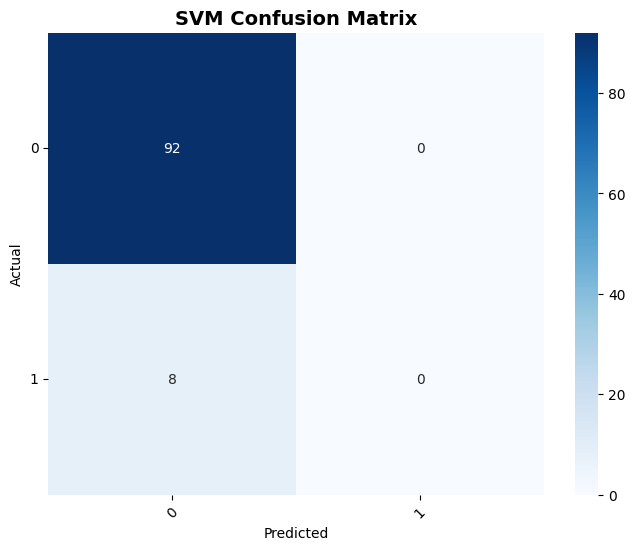

In [40]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
svm = SVC(kernel='rbf', random_state=42, probability=True)
svm.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_svm = svm.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_svm = accuracy_score(y_test, y_pred_svm)
print("=== Support Vector Machine (SVM) ===")
print("Accuracy:", round(acc_svm, 3))
print("\n", classification_report(y_test, y_pred_svm, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_svm)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("SVM Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**7. Logistic Regression:-**

=== Logistic Regression ===
Accuracy: 0.92

               precision    recall  f1-score   support

           0       0.92      1.00      0.96        92
           1       0.00      0.00      0.00         8

    accuracy                           0.92       100
   macro avg       0.46      0.50      0.48       100
weighted avg       0.85      0.92      0.88       100



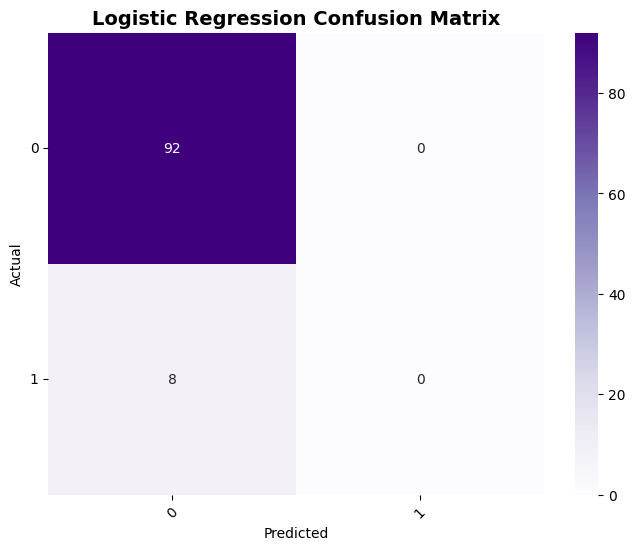

In [41]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_lr = lr.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_lr = accuracy_score(y_test, y_pred_lr)
print("=== Logistic Regression ===")
print("Accuracy:", round(acc_lr, 3))
print("\n", classification_report(y_test, y_pred_lr, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("Logistic Regression Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**8. Bernoulli Naive Bayes (BNB):-**

=== Bernoulli Naive Bayes (BNB) ===
Accuracy: 0.91

               precision    recall  f1-score   support

           0       0.93      0.98      0.95        92
           1       0.33      0.12      0.18         8

    accuracy                           0.91       100
   macro avg       0.63      0.55      0.57       100
weighted avg       0.88      0.91      0.89       100



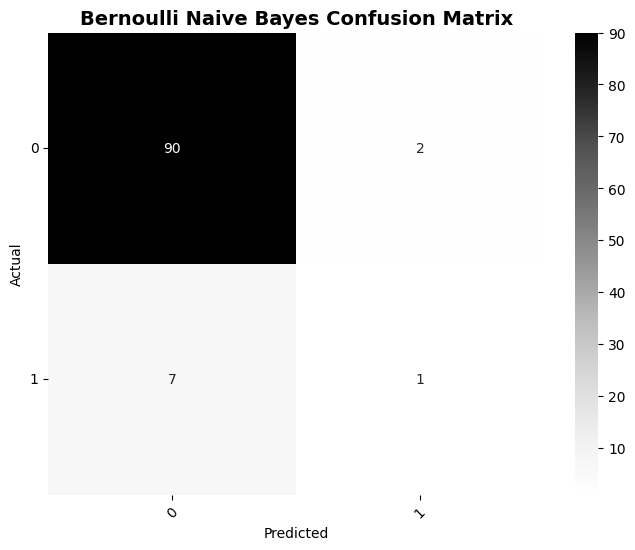

In [42]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
bnb = BernoulliNB()
bnb.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_bnb = bnb.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_bnb = accuracy_score(y_test, y_pred_bnb)
print("=== Bernoulli Naive Bayes (BNB) ===")
print("Accuracy:", round(acc_bnb, 3))
print("\n", classification_report(y_test, y_pred_bnb, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bnb)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greys',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("Bernoulli Naive Bayes Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**9. Gaussian Naive Bayes (GNB):-**

=== Gaussian Naive Bayes (GNB) ===
Accuracy: 0.51

               precision    recall  f1-score   support

           0       1.00      0.47      0.64        92
           1       0.14      1.00      0.25         8

    accuracy                           0.51       100
   macro avg       0.57      0.73      0.44       100
weighted avg       0.93      0.51      0.61       100



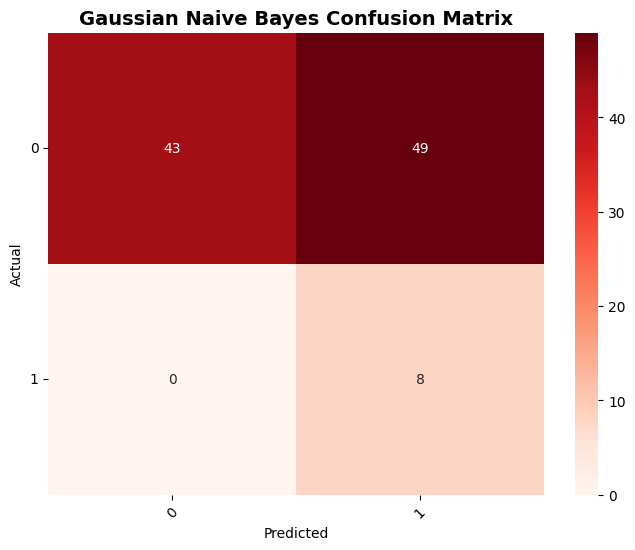

In [43]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
gnb = GaussianNB()
gnb.fit(preprocessor.fit_transform(X_train).toarray() if hasattr(preprocessor.fit_transform(X_train), "toarray") else preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_gnb = gnb.predict(preprocessor.transform(X_test).toarray() if hasattr(preprocessor.transform(X_test), "toarray") else preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_gnb = accuracy_score(y_test, y_pred_gnb)
print("=== Gaussian Naive Bayes (GNB) ===")
print("Accuracy:", round(acc_gnb, 3))
print("\n", classification_report(y_test, y_pred_gnb, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_gnb)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("Gaussian Naive Bayes Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**10. AdaBoost Classifier:-**

=== AdaBoost Classifier ===
Accuracy: 0.93

               precision    recall  f1-score   support

           0       0.93      1.00      0.96        92
           1       1.00      0.12      0.22         8

    accuracy                           0.93       100
   macro avg       0.96      0.56      0.59       100
weighted avg       0.93      0.93      0.90       100



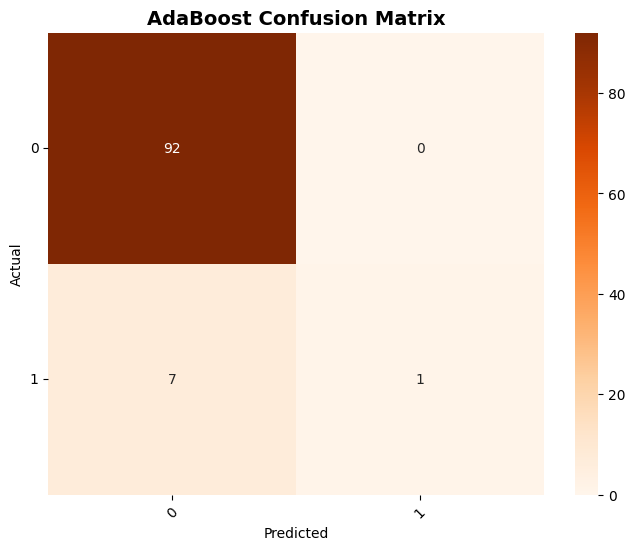

In [44]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
ada = AdaBoostClassifier(random_state=42, n_estimators=100)
ada.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_ada = ada.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_ada = accuracy_score(y_test, y_pred_ada)
print("=== AdaBoost Classifier ===")
print("Accuracy:", round(acc_ada, 3))
print("\n", classification_report(y_test, y_pred_ada, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_ada)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("AdaBoost Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**11. XGBoost Classifier:-**

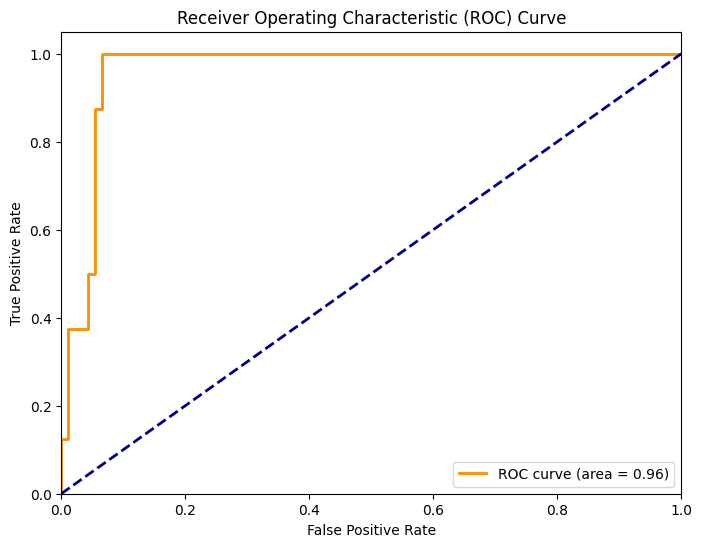

In [45]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from xgboost import XGBClassifier # Import XGBClassifier

# Choose the model to plot the ROC curve for
# model_to_plot = xgb # This line is not needed here

# Instantiate and train the XGBoost model
xgb = XGBClassifier(random_state=42) # Define xgb
xgb.fit(preprocessor.transform(X_train), y_train) # Train the model

# Get the predicted probabilities for the positive class
y_pred_proba = xgb.predict_proba(preprocessor.transform(X_test))[:, 1]

# Calculate the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Calculate the AUC (Area Under the Curve)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

**12. CatBoost Classifier:-**

=== CatBoost Classifier ===
Accuracy: 0.91

               precision    recall  f1-score   support

           0       0.93      0.98      0.95        92
           1       0.33      0.12      0.18         8

    accuracy                           0.91       100
   macro avg       0.63      0.55      0.57       100
weighted avg       0.88      0.91      0.89       100



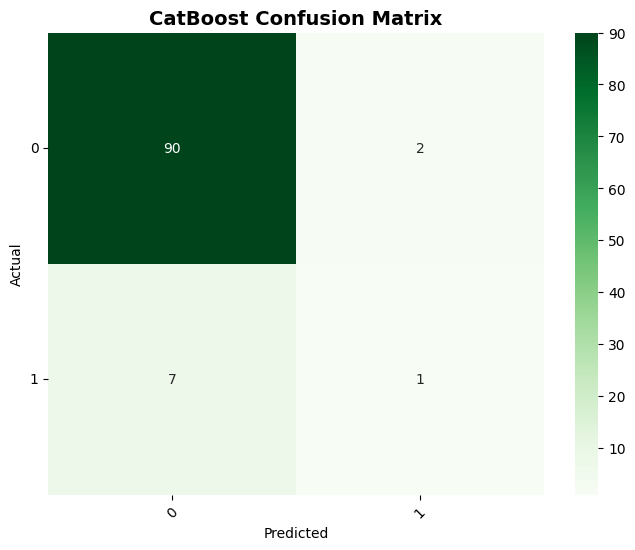

In [46]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
cat = CatBoostClassifier(verbose=0, random_state=42)
cat.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_cat = cat.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_cat = accuracy_score(y_test, y_pred_cat)
print("=== CatBoost Classifier ===")
print("Accuracy:", round(acc_cat, 3))
print("\n", classification_report(y_test, y_pred_cat, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_cat)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("CatBoost Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**13. LightGBM Classifier:-**

[LightGBM] [Info] Number of positive: 30, number of negative: 370
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002193 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 121
[LightGBM] [Info] Number of data points in the train set: 400, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.075000 -> initscore=-2.512306
[LightGBM] [Info] Start training from score -2.512306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


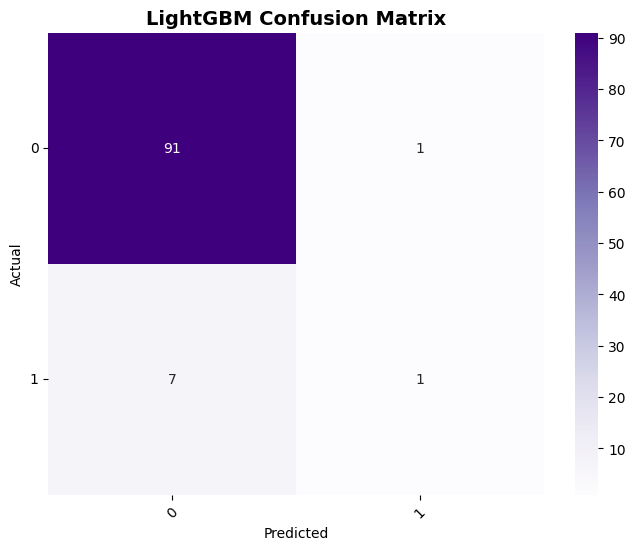

In [47]:
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# ⚙️ Model Training
lgb = LGBMClassifier(random_state=42)
lgb.fit(preprocessor.fit_transform(X_train), y_train)

# 🔍 Predictions
y_pred_lgb = lgb.predict(preprocessor.transform(X_test))

# 📊 Accuracy & Report
acc_lgb = accuracy_score(y_test, y_pred_lgb)
print("=== LightGBM Classifier ===")
print("Accuracy:", round(acc_lgb, 3))
print("\n", classification_report(y_test, y_pred_lgb, target_names=[str(cls) for cls in le.classes_]))

# 🎨 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_lgb)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
            xticklabels=[str(cls) for cls in le.classes_], yticklabels=[str(cls) for cls in le.classes_])
plt.title("LightGBM Confusion Matrix", fontsize=14, fontweight='bold')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

**14.  All Model Accuracy Comparison:-**

=== Model Accuracy Comparison ===

              Model  Accuracy
                KNN      0.93
            XGBoost      0.93
           AdaBoost      0.93
Logistic Regression      0.92
                SVM      0.92
           LightGBM      0.92
       Bernoulli NB      0.91
           CatBoost      0.91
        Gaussian NB      0.51


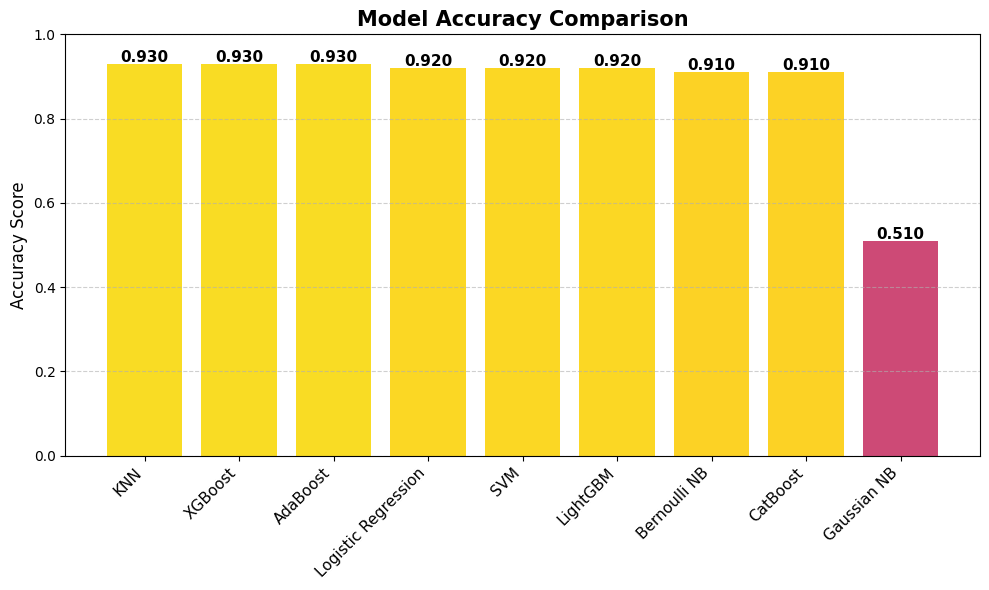

In [48]:
# 📊 ACCURACY COMPARISON OF ALL CLASSIFIERS
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# Calculate accuracy for XGBoost (assuming xgb is defined and trained)
# You might need to run the cell that defines and trains xgb first if you haven't already
try:
    y_pred_xgb = xgb.predict(preprocessor.transform(X_test))
    acc_xgb = accuracy_score(y_test, y_pred_xgb)
except NameError:
    print("XGBoost model (xgb) not found. Please run the cell that trains the XGBoost model.")
    acc_xgb = None # Set to None or handle as appropriate if xgb is not available


# ✅ Include all model accuracies
accuracy_scores = {
    'Logistic Regression': acc_lr,
    'KNN': acc_knn,
    'SVM': acc_svm,
    'Bernoulli NB': acc_bnb,
    'Gaussian NB': acc_gnb,
    'AdaBoost': acc_ada,
    'XGBoost': acc_xgb,
    'CatBoost': acc_cat,
    'LightGBM': acc_lgb
}

# Remove None values in case a model wasn't trained
accuracy_scores = {k: v for k, v in accuracy_scores.items() if v is not None}


# Convert to DataFrame
acc_df = pd.DataFrame(list(accuracy_scores.items()), columns=['Model', 'Accuracy'])
acc_df = acc_df.sort_values(by='Accuracy', ascending=False)

# 🪄 Display table
print("=== Model Accuracy Comparison ===\n")
print(acc_df.to_string(index=False))

# 🎨 Bar Graph
plt.figure(figsize=(10,6))
bars = plt.bar(acc_df['Model'], acc_df['Accuracy'], color=plt.cm.plasma(acc_df['Accuracy']))

# Label accuracy on bars
for bar, acc in zip(bars, acc_df['Accuracy']):
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
             f"{acc:.3f}", ha='center', fontsize=11, fontweight='bold')

plt.title("Model Accuracy Comparison", fontsize=15, fontweight='bold')
plt.ylabel("Accuracy Score", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=11)
plt.ylim(0, 1)
plt.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

**15.  TRAIN ALL MODELS (Binary Classification):-**

In [49]:
# ✅ TRAIN ALL MODELS (Binary Classification)
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Encode categorical columns (same as in SHAP)
from sklearn.preprocessing import LabelEncoder
def encode_categoricals(df):
    df_encoded = df.copy()
    for col in df_encoded.select_dtypes(include=['object', 'category']).columns:
        df_encoded[col] = LabelEncoder().fit_transform(df_encoded[col].astype(str))
    return df_encoded

X_train_enc = encode_categoricals(X_train)
X_test_enc = encode_categoricals(X_test)

y_train_enc = y_train.astype(int)
y_test_enc = y_test.astype(int)

# ✅ Train Models
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_enc, y_train_enc)

xgb_model = XGBClassifier(random_state=42, eval_metric='logloss', use_label_encoder=False)
xgb_model.fit(X_train_enc, y_train_enc)

lgb_model = LGBMClassifier(random_state=42)
lgb_model.fit(X_train_enc, y_train_enc)

cat_model = CatBoostClassifier(verbose=0, random_state=42)
cat_model.fit(X_train_enc, y_train_enc)


[LightGBM] [Info] Number of positive: 30, number of negative: 370
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102
[LightGBM] [Info] Number of data points in the train set: 400, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.075000 -> initscore=-2.512306
[LightGBM] [Info] Start training from score -2.512306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

**16. SHAP for All Model:-**


--- SHAP for RandomForest ---
✅ Using shap.Explainer output format.
❌ Failed SHAP for RandomForest: list index out of range

--- SHAP for XGBoost ---


  0%|          | 0/50 [00:00<?, ?it/s]

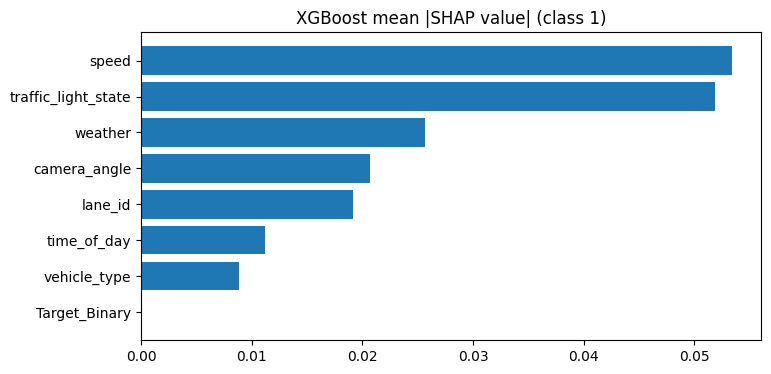

summary_plot failed: Feature and SHAP matrices must have the same number of rows!


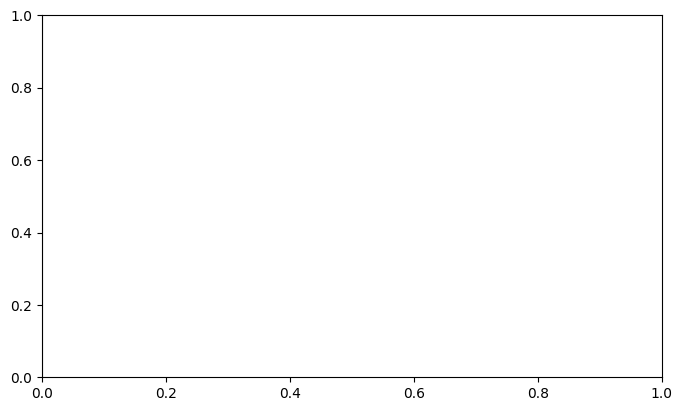

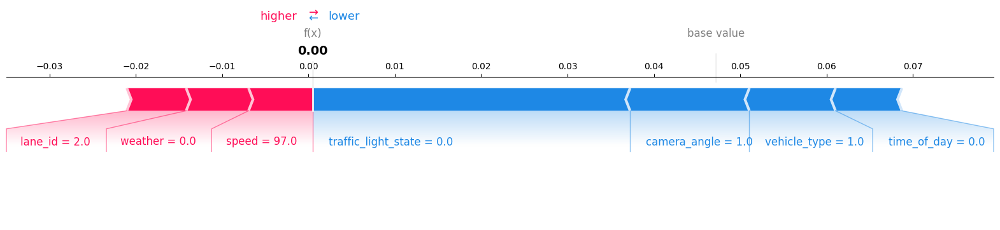


--- SHAP for LightGBM ---
✅ Using shap.Explainer output format.


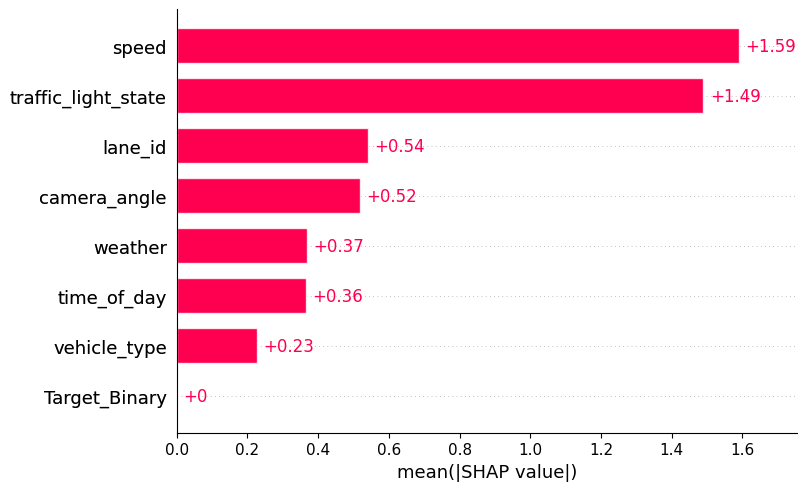

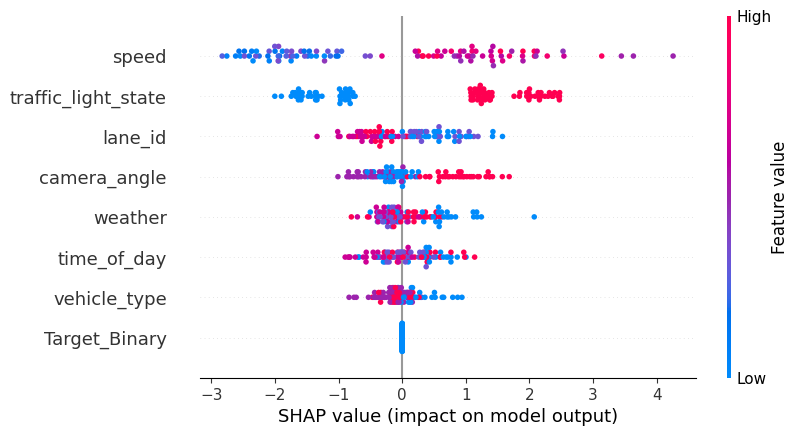


--- SHAP for CatBoost ---


 92%|==================  | 92/100 [00:15<00:01]       

✅ Using shap.Explainer output format.


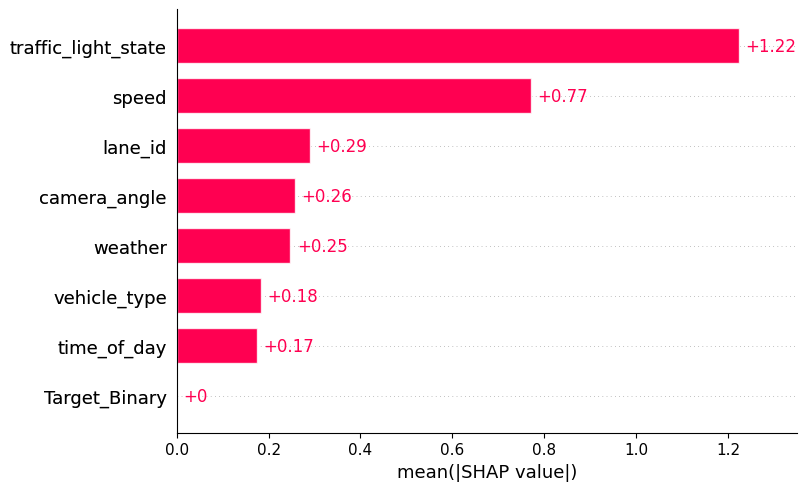

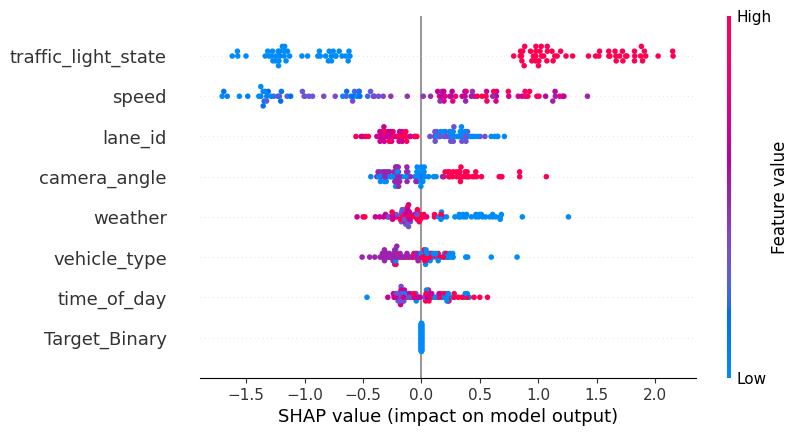


Library versions:
shap: 0.49.1
xgboost: 3.1.1
lightgbm: 4.6.0
catboost: 1.2.8


In [50]:
import shap, inspect, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
shap.initjs()

# -----------------------------
# 🧩 SAFE CONVERSIONS
# -----------------------------
def encode_categoricals(df):
    """Label encode all object or category columns to numeric."""
    df_encoded = df.copy()
    for col in df_encoded.select_dtypes(include=['object', 'category']).columns:
        df_encoded[col] = LabelEncoder().fit_transform(df_encoded[col].astype(str))
    return df_encoded

def to_float_safe(x):
    """Convert x to a plain python float if possible."""
    try:
        if hasattr(x, "tolist"):
            x = x.tolist()
        if isinstance(x, (list, tuple, np.ndarray)) and len(x) > 0:
            candidate = x[0]
        else:
            candidate = x
        s = str(candidate).strip().replace("[", "").replace("]", "")
        return float(s)
    except Exception:
        return None

# -----------------------------
# ⚙️ UNIVERSAL SAFE SHAP
# -----------------------------
def safe_shap_for_model(model, X_background, X_explain, model_name="model"):
    last_err = None

    # Try shap.Explainer (auto)
    try:
        explainer = shap.Explainer(model, X_background, feature_names=X_explain.columns)
        shap_values = explainer(X_explain)
        return explainer, shap_values, explainer.expected_value
    except Exception as e:
        last_err = e

    # Try TreeExplainer
    try:
        explainer = shap.TreeExplainer(model)
        shap_values_raw = explainer.shap_values(X_explain)
        expected_val_raw = explainer.expected_value
        expected_value = to_float_safe(expected_val_raw)

        if isinstance(shap_values_raw, list):
            sv = np.array(shap_values_raw[1], dtype=float) if len(shap_values_raw) > 1 else np.array(shap_values_raw[0], dtype=float)
        else:
            sv = np.array(shap_values_raw, dtype=float)

        return explainer, sv, expected_value if expected_value is not None else explainer.expected_value
    except Exception as e:
        last_err = e

    # KernelExplainer fallback
    try:
        bg = resample(X_background, n_samples=min(100, len(X_background)), random_state=42)
        if hasattr(model, "predict_proba"):
            f = lambda x: model.predict_proba(pd.DataFrame(x, columns=X_explain.columns))[:,1]
        else:
            f = lambda x: model.predict(pd.DataFrame(x, columns=X_explain.columns))

        explainer = shap.KernelExplainer(f, bg.values)
        shap_vals = explainer.shap_values(X_explain.iloc[:min(50, len(X_explain))].values)
        return explainer, shap_vals, explainer.expected_value
    except Exception as e:
        last_err = e

    raise last_err

# -----------------------------
# 🧠 MODELS TO EXPLAIN
# -----------------------------
models = {
    "RandomForest": rf,
    "XGBoost": xgb_model,
    "LightGBM": lgb_model,
    "CatBoost": cat_model
}

# -----------------------------
# 🧮 PREPROCESS DATA FOR SHAP
# -----------------------------
background = X_train.copy().reset_index(drop=True) if 'X_train' in globals() else X_test.copy().reset_index(drop=True)
X_explain = X_test.copy().reset_index(drop=True)

# Encode categorical columns safely
background = encode_categoricals(background)
X_explain = encode_categoricals(X_explain)

# Sample subset for faster SHAP computation
if X_explain.shape[0] > 500:
    X_explain = X_explain.sample(500, random_state=42).reset_index(drop=True)

# -----------------------------
# 📊 GENERATE SHAP PLOTS
# -----------------------------
for name, m in models.items():
    try:
        print(f"\n--- SHAP for {name} ---")
        explainer, shap_vals, expected_val = safe_shap_for_model(m, background, X_explain, model_name=name)

        # Handle Explainer output
        if hasattr(shap_vals, "values"):
            print("✅ Using shap.Explainer output format.")
            shap.plots.bar(shap_vals)
            shap.plots.beeswarm(shap_vals)
            try:
                shap.plots.force(shap_vals[0])
            except Exception:
                shap.force_plot(expected_val, shap_vals.values[0], X_explain.iloc[0], matplotlib=True)
        else:
            mean_abs = np.mean(np.abs(shap_vals), axis=0)
            feat_order = np.argsort(-mean_abs)
            plt.figure(figsize=(8,4))
            plt.barh(X_explain.columns[feat_order], mean_abs[feat_order])
            plt.title(f"{name} mean |SHAP value| (class 1)")
            plt.gca().invert_yaxis()
            plt.show()

            try:
                shap.summary_plot(shap_vals, X_explain)
            except Exception as e:
                print("summary_plot failed:", e)
            try:
                shap.force_plot(expected_val, shap_vals[0,:], X_explain.iloc[0,:], matplotlib=True)
            except Exception as e:
                print("force_plot failed:", e)
    except Exception as e:
        print(f"❌ Failed SHAP for {name}: {e}")

# -----------------------------
# 📦 LIBRARY VERSION INFO
# -----------------------------
print("\nLibrary versions:")
print("shap:", shap.__version__)
try:
    import xgboost; print("xgboost:", xgboost.__version__)
except: pass
try:
    import lightgbm; print("lightgbm:", lightgbm.__version__)
except: pass
try:
    import catboost; print("catboost:", catboost.__version__)
except: pass


**17. LIME Explanation:-**

In [60]:
!pip install lime --quiet
from lime.lime_tabular import LimeTabularExplainer


--- 💡 LIME Explanation ---

LIME for RandomForest (sample 0)


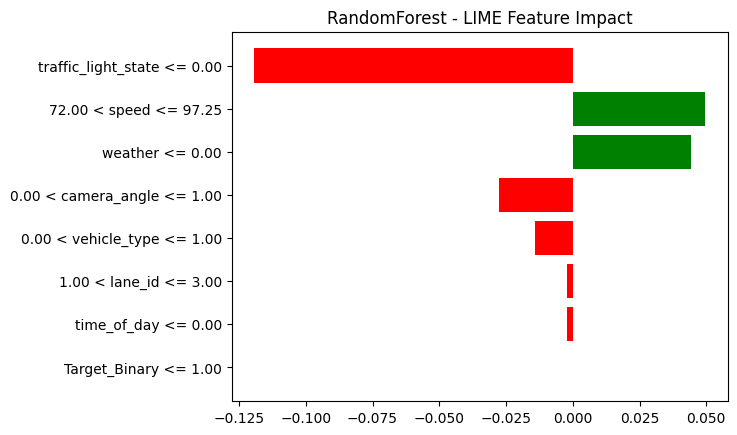


LIME for XGBoost (sample 0)


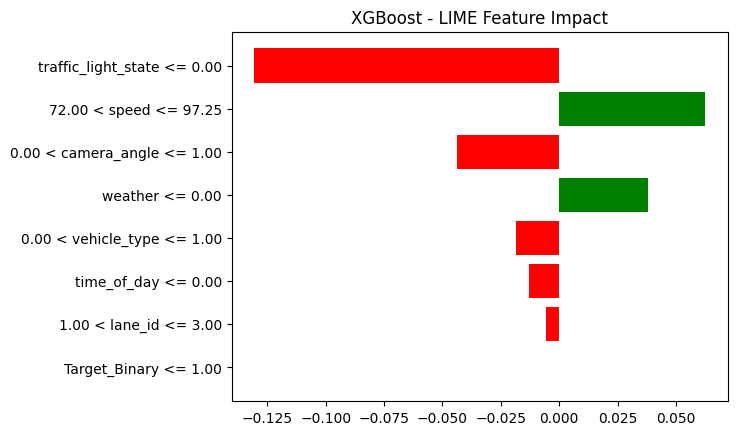


LIME for LightGBM (sample 0)


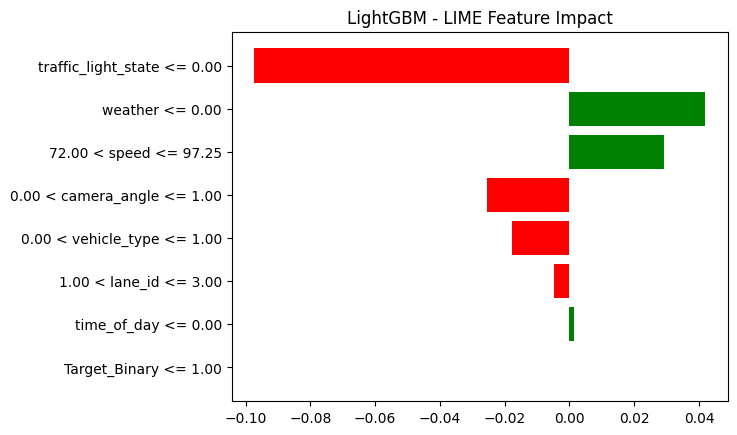


LIME for CatBoost (sample 0)


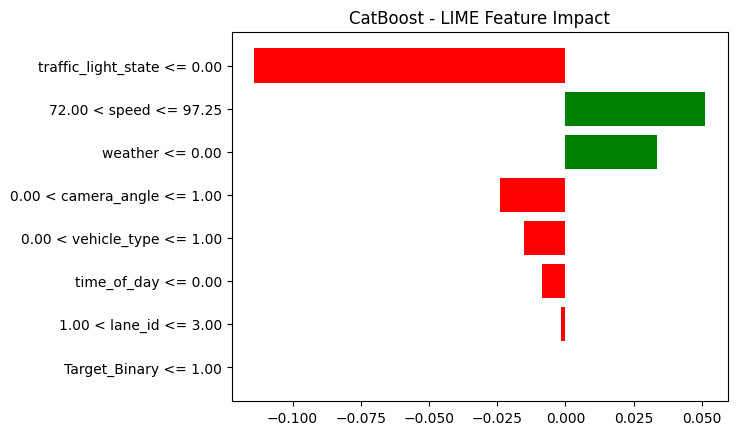


Library versions:
shap: 0.49.1
xgboost: 3.1.1
lightgbm: 4.6.0
catboost: 1.2.8


In [61]:
# -----------------------------
# 💡 LIME Explanation (for one sample)
# -----------------------------
print("\n--- 💡 LIME Explanation ---")

import shap, inspect, numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder
# from lime.lime_tabular import LimeTabularExplainer # Import LimeTabularExplainer - Moved to installation cell

sample_index = 0  # change this to explain another test sample
lime_explainer = LimeTabularExplainer(
    training_data=np.array(X_train_enc),
    feature_names=X_train_enc.columns,
    class_names=['No Violation', 'Violation'],
    mode='classification'
)

for name, model in models.items():
    print(f"\nLIME for {name} (sample {sample_index})")
    exp = lime_explainer.explain_instance(
        data_row=X_test_enc.iloc[sample_index],
        predict_fn=model.predict_proba
    )
    exp.show_in_notebook(show_table=True)
    try:
        exp.as_pyplot_figure()
        plt.title(f"{name} - LIME Feature Impact")
        plt.show()
    except Exception as e:
        print("⚠️ Plot failed:", e)

# -----------------------------
# 🔢 Version info
# -----------------------------
print("\nLibrary versions:")
print("shap:", shap.__version__)
import xgboost, lightgbm, catboost
print("xgboost:", xgboost.__version__)
print("lightgbm:", lightgbm.__version__)
print("catboost:", catboost.__version__)

**17. PDP & ICE for Model Interpretation:-**

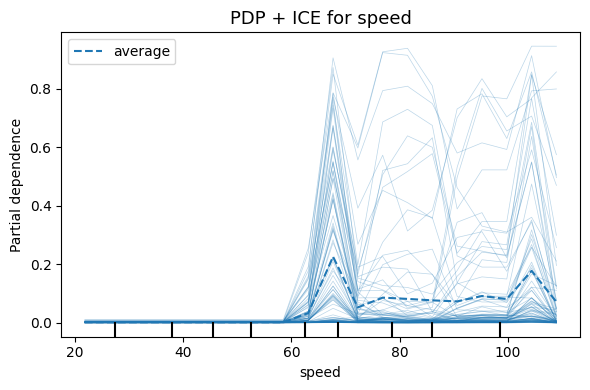

⚠️ Could not plot PDP/ICE for traffic_light_state: cannot reshape array of size 1 into shape (2)


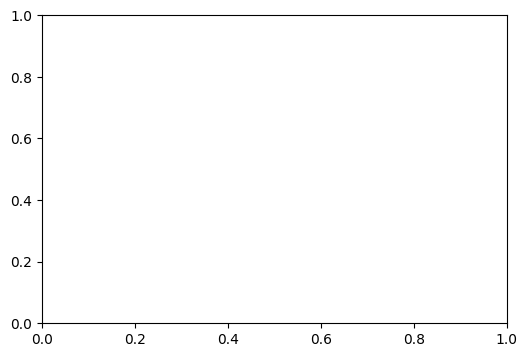

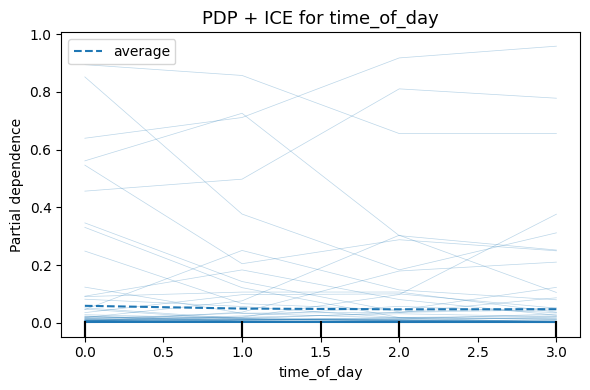

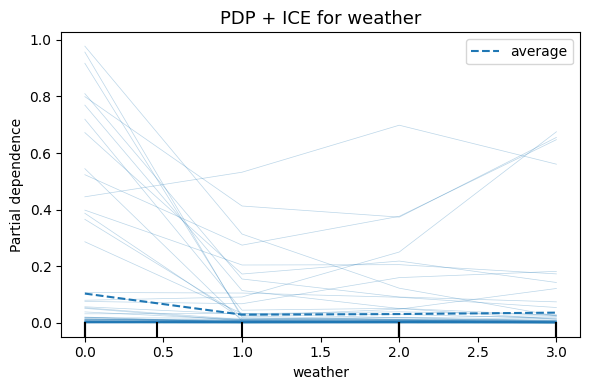

In [62]:
# ===========================================
# 🚀 PDP & ICE for Model Interpretation (Fixed)
# ===========================================
from sklearn.inspection import PartialDependenceDisplay
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import pandas as pd

# Choose the model to interpret
model_to_explain = xgb_model  # or lgb_model, rf_model, cat_model

# ✅ Select a few important features
features_to_plot = ["speed", "traffic_light_state", "time_of_day", "weather"]

# Copy test data
X_test_pdp = X_test.copy()

# ✅ Encode object/categorical columns numerically
encoders = {}
for col in X_test_pdp.select_dtypes(include=['object']).columns:
    le = LabelEncoder()
    X_test_pdp[col] = le.fit_transform(X_test_pdp[col].astype(str))
    encoders[col] = le

# ✅ Loop through features for PDP + ICE plots
for feature in features_to_plot:
    try:
        fig, ax = plt.subplots(figsize=(6, 4))
        PartialDependenceDisplay.from_estimator(
            model_to_explain,
            X_test_pdp,
            [feature],
            kind="both",   # 'average' (PDP) + 'individual' (ICE)
            subsample=100,
            grid_resolution=20,
            n_jobs=-1,
            ax=ax
        )
        plt.title(f"PDP + ICE for {feature}", fontsize=13)
        plt.tight_layout()
        plt.show()
    except Exception as e:
        print(f"⚠️ Could not plot PDP/ICE for {feature}: {e}")


**18. ROC-AUC Comparison for All Models:-**

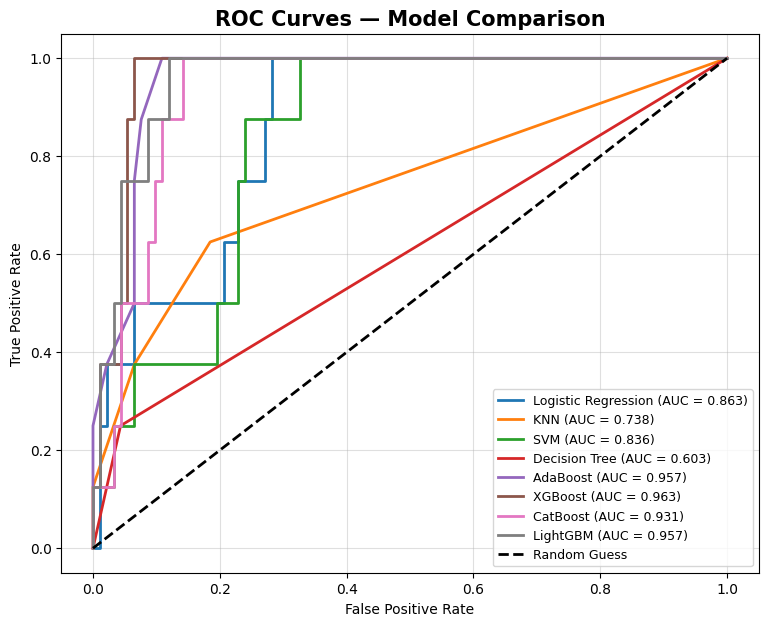


=== AUC Scores ===
XGBoost              : 0.963
LightGBM             : 0.957
AdaBoost             : 0.957
CatBoost             : 0.931
Logistic Regression  : 0.863
SVM                  : 0.836
KNN                  : 0.738
Decision Tree        : 0.603


In [63]:
# 📈 ROC-AUC Comparison for All Models
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np

# ✅ Ensure binary classification (e.g., Over-speeding vs Signal Jumping)
if len(np.unique(y_test)) != 2:
    print("⚠️ ROC-AUC works only for binary classification. You currently have", len(np.unique(y_test)), "classes.")
else:
    models = {
        "Logistic Regression": lr,
        "KNN": knn,
        "SVM": svm,
        "Decision Tree": dt,
        "AdaBoost": ada,
        "XGBoost": xgb,
        "CatBoost": cat,
        "LightGBM": lgb
    }

    plt.figure(figsize=(9, 7))
    auc_scores = {}

    for name, model in models.items():
        # Predict probabilities (for ROC)
        if hasattr(model, "predict_proba"):
            # Handle sparse data for models that require dense input (like GaussianNB - although not in this dict)
            X_test_processed = preprocessor.transform(X_test)
            if isinstance(model, (BernoulliNB, GaussianNB)):
                 y_score = model.predict_proba(X_test_processed.toarray())[:, 1]
            else:
                y_score = model.predict_proba(X_test_processed)[:, 1]

        else:
            # Some models (like SVM with linear kernel) use decision_function
            # Handle sparse data if necessary
            X_test_processed = preprocessor.transform(X_test)
            if isinstance(model, (BernoulliNB, GaussianNB)):
                 y_score = model.decision_function(X_test_processed.toarray())
            else:
                 y_score = model.decision_function(X_test_processed)


        auc = roc_auc_score(y_test, y_score)
        auc_scores[name] = auc

        fpr, tpr, _ = roc_curve(y_test, y_score)
        plt.plot(fpr, tpr, lw=2, label=f"{name} (AUC = {auc:.3f})")

    # Random guess line
    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guess')

    plt.title("ROC Curves — Model Comparison", fontsize=15, fontweight='bold')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right", fontsize=9)
    plt.grid(alpha=0.4)
    plt.show()

    # 🧾 Print AUC scores
    print("\n=== AUC Scores ===")
    for name, auc in sorted(auc_scores.items(), key=lambda x: x[1], reverse=True):
        print(f"{name:20s} : {auc:.3f}")

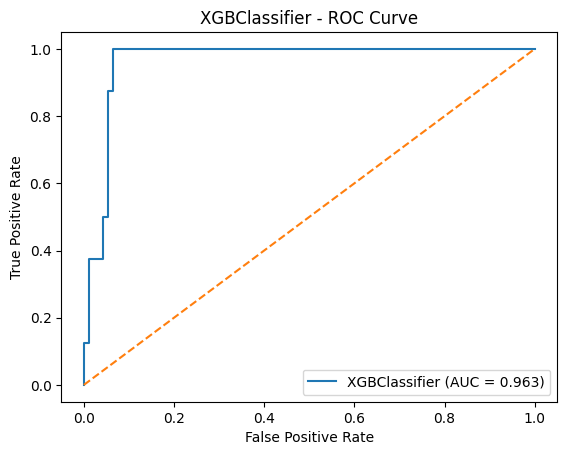

In [64]:
from sklearn.metrics import roc_curve, auc

# Choose which model to plot the ROC curve for (e.g., xgb, lgb, lr, etc.)
# Make sure the model you choose has a predict_proba method
model_to_plot = xgb  # You can change this to any trained model variable

# ROC curve for the selected model
if hasattr(model_to_plot, "predict_proba"):
    # Handle sparse data if necessary (similar to the previous cell)
    X_test_processed = preprocessor.transform(X_test)
    if isinstance(model_to_plot, (BernoulliNB, GaussianNB)):
         y_prob = model_to_plot.predict_proba(X_test_processed.toarray())[:, 1]
    else:
        y_prob = model_to_plot.predict_proba(X_test_processed)[:, 1]

    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label=f"{type(model_to_plot).__name__} (AUC = {roc_auc:.3f})")
    plt.plot([0,1],[0,1],"--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"{type(model_to_plot).__name__} - ROC Curve")
    plt.legend()
    plt.show()
else:
    print(f"The selected model ({type(model_to_plot).__name__}) does not have a 'predict_proba' method required for ROC curves.")

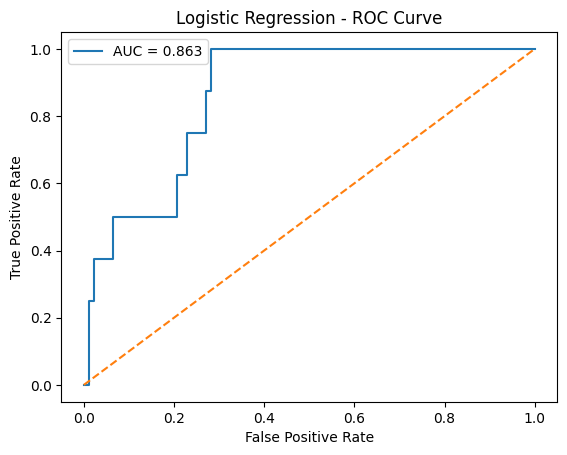

In [65]:
# ROC - Logistic Regression
y_prob = lr.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression - ROC Curve")
plt.legend()
plt.show()

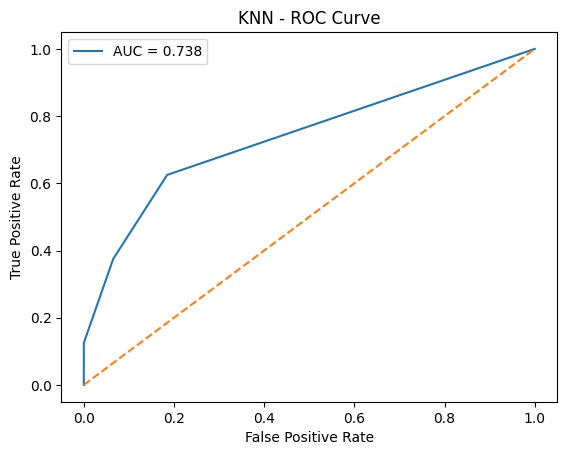

In [66]:
# ROC - KNN
y_prob = knn.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("KNN - ROC Curve")
plt.legend()
plt.show()

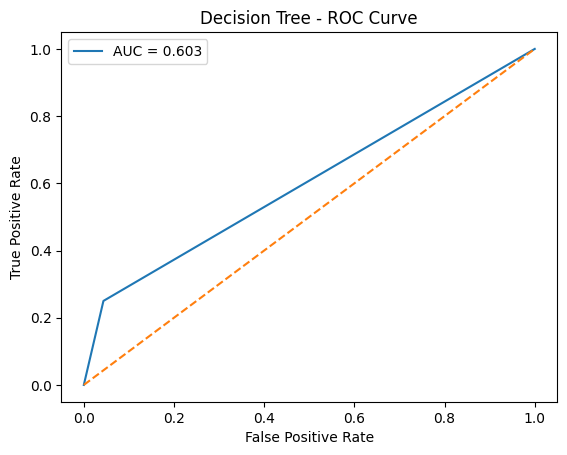

In [67]:
# ROC - Decision Tree
y_prob = dt.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Decision Tree - ROC Curve")
plt.legend()
plt.show()

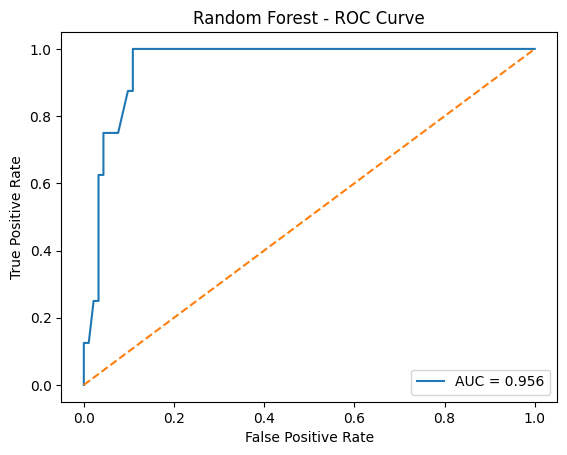

In [68]:
# ROC - Random Forest
y_prob = rf.predict_proba(X_test_enc)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Random Forest - ROC Curve")
plt.legend()
plt.show()

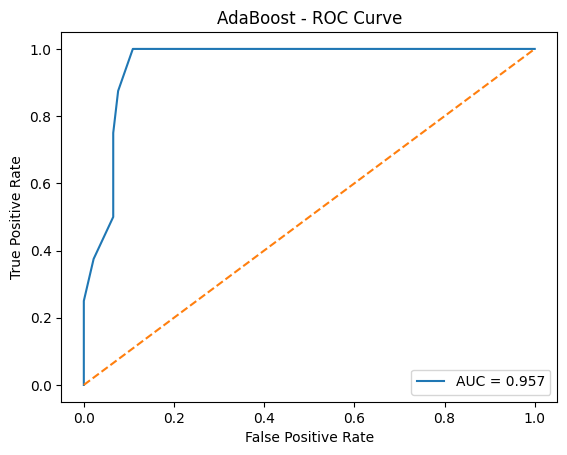

In [69]:
# ROC - AdaBoost
y_prob = ada.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AdaBoost - ROC Curve")
plt.legend()
plt.show()

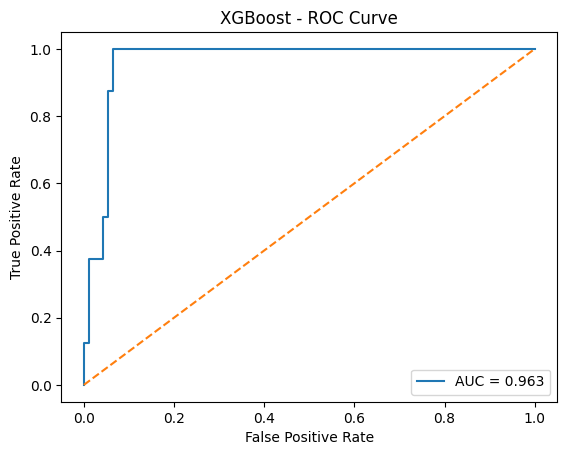

In [70]:
# ROC - XGBoost
y_prob = xgb.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("XGBoost - ROC Curve")
plt.legend()
plt.show()

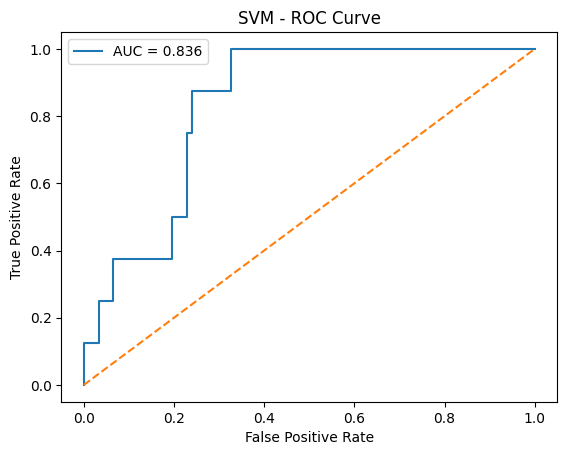

In [71]:
# ROC - SVM
y_prob = svm.predict_proba(preprocessor.transform(X_test))[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("SVM - ROC Curve")
plt.legend()
plt.show()

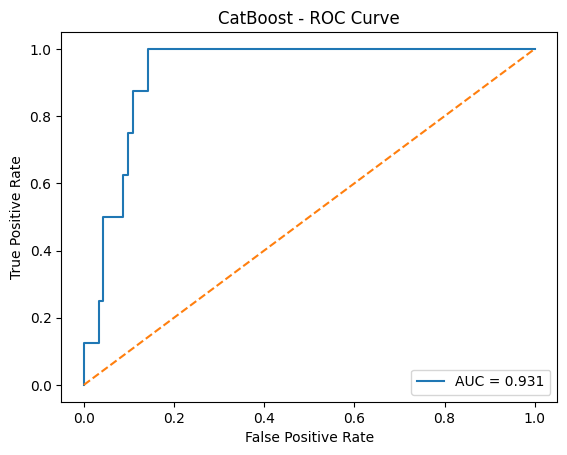

In [72]:
# ROC - CatBoost
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

if 'cat' in globals():
    y_prob = cat.predict_proba(preprocessor.transform(X_test))[:,1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
    plt.plot([0,1],[0,1],"--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("CatBoost - ROC Curve")
    plt.legend()
    plt.show()
else:
    print("CatBoost model (cat) not found. Please run the cell that trains the CatBoost model.")

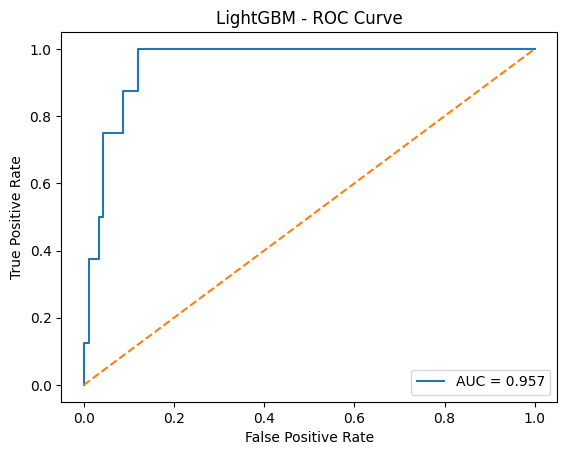

In [73]:
# ROC - LightGBM
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

if 'lgb' in globals():
    y_prob = lgb.predict_proba(preprocessor.transform(X_test))[:,1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
    plt.plot([0,1],[0,1],"--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("LightGBM - ROC Curve")
    plt.legend()
    plt.show()
else:
    print("LightGBM model (lgb) not found. Please run the cell that trains the LightGBM model.")

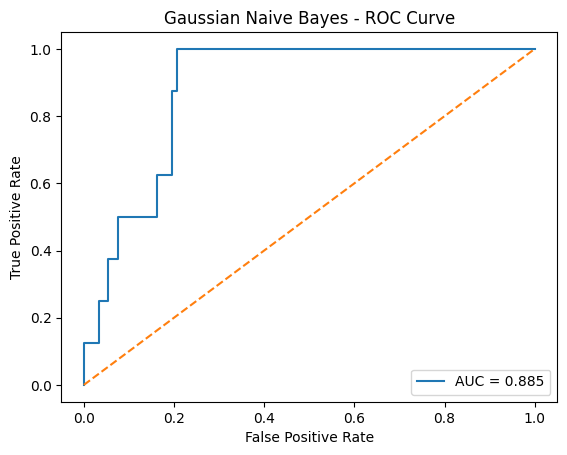

In [74]:
# ROC - Naive Bayes
X_test_processed = preprocessor.transform(X_test)   # because NB does not accept sparse pipelines inside

y_prob = gnb.predict_proba(X_test_processed)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

plt.plot(fpr, tpr, label="AUC = %.3f" % roc_auc)
plt.plot([0,1],[0,1],"--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Gaussian Naive Bayes - ROC Curve")
plt.legend()
plt.show()